In [1]:
#import mnist dataset
from sklearn.datasets import fetch_openml
mnist = fetch_openml('mnist_784', version=1)
X = mnist.data
y = mnist.target

In [2]:
X.shape, y.shape

((70000, 784), (70000,))

0


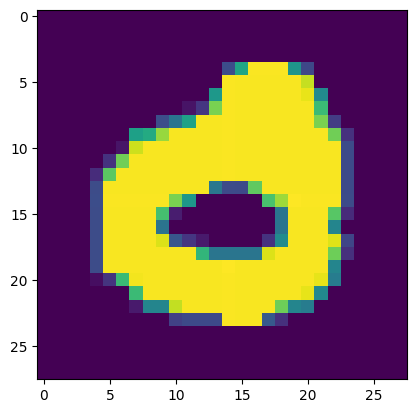

In [3]:
import matplotlib.pyplot as plt
i = 1999
print(y.iloc[i])
plt.imshow(X.iloc[i].values.reshape(28,28))

In [5]:
#Train test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [5]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [6]:
import time 

In [7]:
start = time.time()
y_pred = knn.predict(X_test)
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy without PCA:", accuracy)
end = time.time()
print("Time taken without PCA:", end - start)

Accuracy without PCA: 0.9700714285714286
Time taken without PCA: 12.970498085021973


In [6]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [11]:
#using PCA
from sklearn.decomposition import PCA
pca = PCA(n_components=100)  
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

In [12]:
X_train_pca.shape, X_test_pca.shape

((56000, 100), (14000, 100))

In [13]:
#Let's use KNN on PCA transformed data
knn_pca = KNeighborsClassifier()
knn_pca.fit(X_train_pca, y_train)

KNeighborsClassifier()

In [14]:
start = time.time()
y_pred_pca = knn_pca.predict(X_test_pca)
accuracy_pca = accuracy_score(y_test, y_pred_pca)
print("Accuracy with PCA:", accuracy_pca)
end = time.time()
print("Time taken with PCA:", end - start)

Accuracy with PCA: 0.9587857142857142
Time taken with PCA: 0.9064633846282959


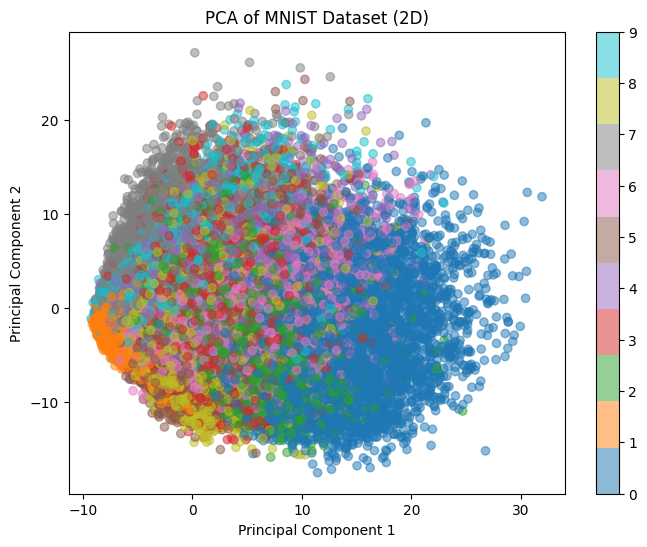

In [17]:
#Let's visualize the PCA with 2D 
pca_2d = PCA(n_components=2)
X_train_2d = pca_2d.fit_transform(X_train_scaled)
plt.figure(figsize=(8,6))
plt.scatter(X_train_2d[:,0], X_train_2d[:,1], c=y_train.astype(int), cmap='tab10', alpha=0.5)
plt.colorbar()
plt.title('PCA of MNIST Dataset (2D)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

In [8]:
#PCA for 3D using plotly
import plotly.express as px
import plotly.io as pio
from sklearn.decomposition import PCA
# Configure plotly for Jupyter/VS Code
pio.renderers.default = "plotly_mimetype+notebook"
pca_3d = PCA(n_components=3)
X_train_3d = pca_3d.fit_transform(X_train_scaled)
fig = px.scatter_3d(x=X_train_3d[:,0], y=X_train_3d[:,1], z=X_train_3d[:,2], color=y_train.astype(int), title='PCA of MNIST Dataset (3D)')
fig.show()

In [12]:
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
import time
#Creating loop to see how well pca works for different number of components
accuracy_list = []
for n in range(1,785):
    pca = PCA(n_components=n)
    X_train_pca = pca.fit_transform(X_train_scaled)
    X_test_pca = pca.transform(X_test_scaled)
    
    knn_pca = KNeighborsClassifier()
    knn_pca.fit(X_train_pca, y_train)
    y_pred_pca = knn_pca.predict(X_test_pca)
    accuracy_pca = accuracy_score(y_test, y_pred_pca)
    accuracy_list.append((n, accuracy_pca))


KeyboardInterrupt: 

In [13]:
accuracy_list

[(1, 0.25642857142857145),
 (2, 0.32107142857142856),
 (3, 0.5111428571428571),
 (4, 0.6697142857142857),
 (5, 0.7385),
 (6, 0.8270714285714286),
 (7, 0.8442142857142857),
 (8, 0.8766428571428572),
 (9, 0.8907142857142857),
 (10, 0.9115),
 (11, 0.9192142857142858),
 (12, 0.924),
 (13, 0.9306428571428571),
 (14, 0.9371428571428572),
 (15, 0.9414285714285714),
 (16, 0.9436428571428571),
 (17, 0.9441428571428572),
 (18, 0.9450714285714286),
 (19, 0.9486428571428571),
 (20, 0.9484285714285714),
 (21, 0.9495714285714286),
 (22, 0.9496428571428571),
 (23, 0.9509285714285715),
 (24, 0.9505714285714286),
 (25, 0.9507142857142857),
 (26, 0.9508571428571428),
 (27, 0.9523571428571429),
 (28, 0.9529285714285715),
 (29, 0.9541428571428572),
 (30, 0.9548571428571428),
 (31, 0.9545714285714286),
 (32, 0.9557857142857142),
 (33, 0.9562142857142857),
 (34, 0.9560714285714286),
 (35, 0.9573571428571429),
 (36, 0.9575714285714285),
 (37, 0.957),
 (38, 0.9586428571428571),
 (39, 0.9589285714285715),
 (40

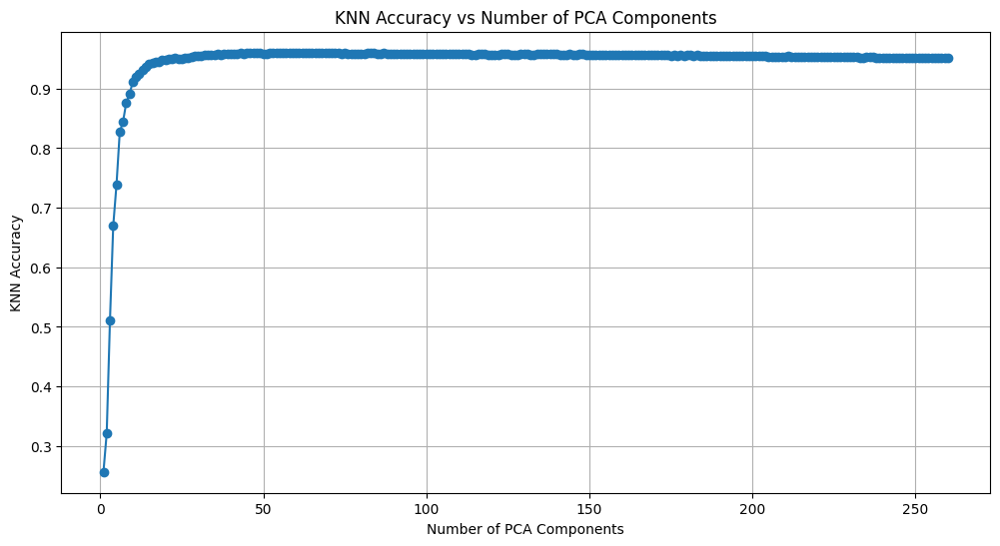

In [14]:
#Lets plot barchart for accuracy vs number of components
import matplotlib.pyplot as plt
components, accuracies = zip(*accuracy_list)
plt.figure(figsize=(12,6))
plt.plot(components, accuracies, marker='o')
plt.title('KNN Accuracy vs Number of PCA Components')
plt.xlabel('Number of PCA Components')
plt.ylabel('KNN Accuracy')
plt.grid()
plt.show()

In [15]:
pca = PCA(n_components=3)
X_train_3d = pca.fit_transform(X_train_scaled)

In [16]:
#Eigen Values and Eigen Vectors
eigen_values = pca.explained_variance_  
eigen_vectors = pca.components_

In [17]:
eigen_values

array([40.6329685 , 29.01311301, 26.91849535])

In [19]:
eigen_vectors.shape

(3, 784)

In [24]:
int(sum(pca.explained_variance_ratio_) * 100)

13

In [30]:
#Let's try to make 90% variance with PCA
pca = PCA(n_components=0.9)
X_train_90 = pca.fit_transform(X_train_scaled)
X_test_90 = pca.transform(X_test_scaled)
int(sum(pca.explained_variance_ratio_) * 100)


90

In [31]:
len(pca.explained_variance_)

235

In [35]:
pca = PCA(n_components=None)
X_train = pca.fit_transform(X_train_scaled)
X_test = pca.transform(X_test_scaled)


In [41]:
import numpy as np
import matplotlib.pyplot as plt

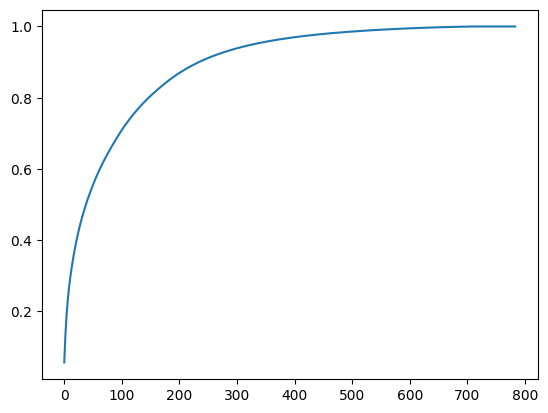

In [42]:
#Let's plot cumulative explained variance ratio
plt.plot(np.cumsum(pca.explained_variance_ratio_))